# Comparación de las inversiones Whittaker BBO-1

## Agua de mar homogénea vs. \(5\) segmentos de agua de mar + \(5\) de buen suelo

Este notebook compara directamente:

- **Whittaker BBO-1 con agua de mar homogénea**  
  `new-real-background-inversion_from_sep_16_22_results_12909279.h5`

- **Whittaker BBO-1 con frontera heterogénea**  
  `new-real-background-inversion_whittaker_ocean5_goodsoil5_BBO1_results_16592871.h5`

La configuración heterogénea, ordenada desde NAA hacia PLO, es:

\[
[G10,G10,G10,G10,G10,G7,G7,G7,G7,G7].
\]

El notebook:

1. localiza y audita ambos archivos;
2. verifica que tengan los mismos tiempos y el mismo target Whittaker;
3. recalcula \(\chi_A^2\), \(\chi_\phi^2\), \(\chi_{\rm total}^2\) y los RMSE;
4. compara las series reconstruidas de amplitud y fase;
5. compara los residuales respecto del target;
6. muestra la diferencia directa entre ambas reconstrucciones;
7. compara los coeficientes ionosféricos y su cercanía a los límites de búsqueda.

> **Precaución metodológica:** la BBO-1 oceánica histórica y la BBO-1 heterogénea no emplearon exactamente el mismo procedimiento de selección de rama de fase. Este notebook compara los resultados guardados, pero no elimina esa diferencia de implementación.

In [2]:
################################################################################
# 1. Dependencias, nombres de archivo y directorio de salida
################################################################################

using HDF5
using Dates
using TimeZones
using Statistics
using DataFrames
using Printf
using CSV
import CairoMakie as CM

const ROOT_DIR = @__DIR__

const OCEAN_FILENAME =
    "new-real-background-inversion_from_sep_16_22_results_12909279.h5"

const HETERO_FILENAME =
    "new-real-background-inversion_whittaker_ocean5_goodsoil5_BBO1_results_16592871.h5"

function find_unique_file(root::AbstractString, filename::AbstractString)
    direct_path = joinpath(root, filename)

    if isfile(direct_path)
        return abspath(direct_path)
    end

    matches = String[]

    for (dir, _, files) in walkdir(root)
        if filename in files
            push!(matches, abspath(joinpath(dir, filename)))
        end
    end

    isempty(matches) && error(
        "No se encontró el archivo:\n$filename\n\n" *
        "Colócalo en el mismo directorio del notebook, en alguno de sus " *
        "subdirectorios, o modifica la ruta en esta celda."
    )

    sort!(matches)

    if length(matches) > 1
        @warn(
            "Se encontraron varias copias de $filename. " *
            "Se usará la primera.",
            matches,
        )
    end

    return first(matches)
end

const OCEAN_H5 = find_unique_file(ROOT_DIR, OCEAN_FILENAME)
const HETERO_H5 = find_unique_file(ROOT_DIR, HETERO_FILENAME)

const FIGURE_DIR = joinpath(
    ROOT_DIR,
    "comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5",
)

mkpath(FIGURE_DIR)

println("Archivo oceánico:")
println("  ", OCEAN_H5)

println("\nArchivo heterogéneo:")
println("  ", HETERO_H5)

println("\nFiguras y tablas:")
println("  ", FIGURE_DIR)

Archivo oceánico:
  /home/jp/basefolder_JP/new-real-background-inversion_from_sep_16_22_results_12909279.h5

Archivo heterogéneo:
  /home/jp/basefolder_JP/outputs_real_background_inversion_whittaker_ocean5_goodsoil5_BBO1/new-real-background-inversion_whittaker_ocean5_goodsoil5_BBO1_results_16592871.h5

Figuras y tablas:
  /home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5


In [6]:
################################################################################
# 2. Lectura robusta de los archivos HDF5
################################################################################

function read_vector(
    path::AbstractString,
    dataset::AbstractString,
)
    return Float64.(vec(h5read(path, dataset)))
end

function read_attribute(
    path::AbstractString,
    object_path::Union{Nothing, AbstractString},
    attribute_name::AbstractString;
    default = missing,
)
    return h5open(path, "r") do f
        obj = object_path === nothing ? f : f[object_path]
        attrs = attributes(obj)

        if !haskey(attrs, attribute_name)
            return default
        end

        # attrs[attribute_name] devuelve HDF5.Attribute.
        # read(...) devuelve el valor almacenado.
        value = read(attrs[attribute_name])

        # Algunos atributos escalares pueden recuperarse como arreglos
        # de un único elemento.
        if value isa AbstractArray &&
           length(value) == 1 &&
           !(value isa Vector{UInt8})

            return only(value)
        end

        return value
    end
end

function attribute_string(x)
    x === missing && return "missing"

    if x isa AbstractString
        return String(x)
    end

    if x isa Vector{UInt8}
        return String(x)
    end

    if x isa AbstractArray && length(x) == 1
        return attribute_string(only(x))
    end

    return string(x)
end

function load_background_inversion(path::AbstractString)
    timestamps_unix = read_vector(
        path,
        "time/timestamps_unix_used",
    )

    zdt = ZonedDateTime.(
        unix2datetime.(timestamps_unix),
        Ref(tz"UTC"),
    )

    return (
        path = abspath(path),

        timestamps_unix = timestamps_unix,
        zdt = zdt,

        target_A = read_vector(
            path,
            "targets/target_A_used",
        ),

        target_phi = read_vector(
            path,
            "targets/target_phi_used",
        ),

        seed_A = read_vector(
            path,
            "seed/A_model",
        ),

        seed_phi = read_vector(
            path,
            "seed/phi_model",
        ),

        seed_params = read_vector(
            path,
            "seed/params_vector",
        ),

        seed_h = read_vector(
            path,
            "seed/h_coeffs",
        ),

        seed_beta = read_vector(
            path,
            "seed/beta_coeffs",
        ),

        reco_A = read_vector(
            path,
            "reconstruction/A_model",
        ),

        reco_phi = read_vector(
            path,
            "reconstruction/phi_model",
        ),

        reco_params = read_vector(
            path,
            "reconstruction/params_vector",
        ),

        reco_h = read_vector(
            path,
            "reconstruction/h_coeffs",
        ),

        reco_beta = read_vector(
            path,
            "reconstruction/beta_coeffs",
        ),

        search_lower = read_vector(
            path,
            "optimization/search_lower",
        ),

        search_upper = read_vector(
            path,
            "optimization/search_upper",
        ),

        seed_loss_saved = Float64(
            read_attribute(
                path,
                "seed",
                "loss",
            ),
        ),

        reco_loss_saved = Float64(
            read_attribute(
                path,
                "reconstruction",
                "loss",
            ),
        ),

        best_fitness_bbo = Float64(
            read_attribute(
                path,
                "optimization",
                "best_fitness_bbo",
            ),
        ),

        elapsed_time_s = Float64(
            read_attribute(
                path,
                "optimization",
                "elapsed_time_sec",
            ),
        ),

        method = attribute_string(
            read_attribute(
                path,
                nothing,
                "bbo_method";
                default = "unknown",
            ),
        ),

        ground_case_key = attribute_string(
            read_attribute(
                path,
                nothing,
                "ground_case_key";
                default = "homogeneous_seawater",
            ),
        ),

        phase_unwrap_method = attribute_string(
            read_attribute(
                path,
                nothing,
                "phase_unwrap_method";
                default = "historical ocean implementation",
            ),
        ),

        parameter_names_string = attribute_string(
            read_attribute(
                path,
                nothing,
                "parameter_names";
                default = "",
            ),
        ),
    )
end

ocean = load_background_inversion(OCEAN_H5)
hetero = load_background_inversion(HETERO_H5)

println("Archivos cargados correctamente.")

println("\nCaso oceánico:")
println("  ", ocean.path)
println("  ground_case_key = ", ocean.ground_case_key)
println("  seed loss        = ", ocean.seed_loss_saved)
println("  reconstruction   = ", ocean.reco_loss_saved)

println("\nCaso heterogéneo:")
println("  ", hetero.path)
println("  ground_case_key = ", hetero.ground_case_key)
println("  seed loss        = ", hetero.seed_loss_saved)
println("  reconstruction   = ", hetero.reco_loss_saved)

Archivos cargados correctamente.

Caso oceánico:
  /home/jp/basefolder_JP/new-real-background-inversion_from_sep_16_22_results_12909279.h5
  ground_case_key = homogeneous_seawater
  seed loss        = 1.2573877059162688
  reconstruction   = 1.083828562113268

Caso heterogéneo:
  /home/jp/basefolder_JP/outputs_real_background_inversion_whittaker_ocean5_goodsoil5_BBO1/new-real-background-inversion_whittaker_ocean5_goodsoil5_BBO1_results_16592871.h5
  ground_case_key = ocean5_goodsoil5
  seed loss        = 4.602646883272219
  reconstruction   = 1.3442170282983954


In [7]:
################################################################################
# 3. Auditoría de comparabilidad
################################################################################

function maximum_absolute_difference(x, y)
    length(x) == length(y) || return Inf
    return maximum(abs.(x .- y))
end

N = length(ocean.timestamps_unix)

length(hetero.timestamps_unix) == N || error(
    "Los archivos no tienen el mismo número de tiempos."
)

maximum_absolute_difference(
    ocean.timestamps_unix,
    hetero.timestamps_unix,
) <= 1e-6 || error(
    "Los tiempos de las dos inversiones no coinciden."
)

target_A_difference = maximum_absolute_difference(
    ocean.target_A,
    hetero.target_A,
)

target_phi_difference = maximum_absolute_difference(
    ocean.target_phi,
    hetero.target_phi,
)

target_A_difference <= 1e-8 || error(
    "Los targets de amplitud no son idénticos."
)

target_phi_difference <= 1e-8 || error(
    "Los targets de fase no son idénticos."
)

all(isfinite, ocean.reco_A) || error(
    "La reconstrucción oceánica de amplitud contiene NaN o Inf."
)
all(isfinite, ocean.reco_phi) || error(
    "La reconstrucción oceánica de fase contiene NaN o Inf."
)
all(isfinite, hetero.reco_A) || error(
    "La reconstrucción heterogénea de amplitud contiene NaN o Inf."
)
all(isfinite, hetero.reco_phi) || error(
    "La reconstrucción heterogénea de fase contiene NaN o Inf."
)

parameter_names = if isempty(ocean.parameter_names_string)
    vcat(
        ["h_c$(i)" for i in 0:8],
        ["beta_c$(i)" for i in 0:5],
    )
else
    split(ocean.parameter_names_string, ",")
end

length(parameter_names) == length(ocean.reco_params) || error(
    "El número de nombres de parámetros no coincide con los parámetros."
)

t_hours = [
    hour(DateTime(t)) +
    minute(DateTime(t)) / 60 +
    second(DateTime(t)) / 3600
    for t in ocean.zdt
]

xtick_hours = collect(18.0:0.5:22.0)
xtick_labels = [
    @sprintf("%02d:%02d", floor(Int, h), round(Int, 60 * (h % 1)))
    for h in xtick_hours
]

df_audit = DataFrame(
    quantity = [
        "Número de tiempos",
        "Primer tiempo UTC",
        "Último tiempo UTC",
        "Máxima diferencia entre tiempos [s]",
        "Máxima diferencia entre targets A [dB]",
        "Máxima diferencia entre targets phi [deg]",
        "Método BBO oceánico",
        "Método BBO heterogéneo",
        "Caso de suelo oceánico",
        "Caso de suelo heterogéneo",
        "Tiempo BBO oceánico [h]",
        "Tiempo BBO heterogéneo [h]",
    ],
    value = string.([
        N,
        first(ocean.zdt),
        last(ocean.zdt),
        maximum_absolute_difference(
            ocean.timestamps_unix,
            hetero.timestamps_unix,
        ),
        target_A_difference,
        target_phi_difference,
        ocean.method,
        hetero.method,
        ocean.ground_case_key,
        hetero.ground_case_key,
        ocean.elapsed_time_s / 3600,
        hetero.elapsed_time_s / 3600,
    ]),
)

display(df_audit)

println("\nAuditoría superada: ambas inversiones usan los mismos tiempos y target.")
println("\nMétodo de fase — océano:")
println(ocean.phase_unwrap_method)
println("\nMétodo de fase — heterogéneo:")
println(hetero.phase_unwrap_method)

Row,quantity,value
,String,String
1,Número de tiempos,17
2,Primer tiempo UTC,2008-03-25T18:00:00+00:00
3,Último tiempo UTC,2008-03-25T22:00:00+00:00
4,Máxima diferencia entre tiempos [s],0.0
5,Máxima diferencia entre targets A [dB],0.0
6,Máxima diferencia entre targets phi [deg],0.0
7,Método BBO oceánico,dxnes
8,Método BBO heterogéneo,dxnes
9,Caso de suelo oceánico,homogeneous_seawater



Auditoría superada: ambas inversiones usan los mismos tiempos y target.

Método de fase — océano:
historical ocean implementation

Método de fase — heterogéneo:
DSP.unwrap on the complete candidate series, followed by one global integer-2pi branch shift relative to the independently unwrapped FIRI reference for the same ground configuration.


In [9]:
################################################################################
# 4. Métricas normalizadas y RMSE
################################################################################

target_A = ocean.target_A
target_phi = ocean.target_phi

scale_A =
    sum((target_A .- mean(target_A)) .^ 2) +
    1e-12

scale_phi =
    sum((target_phi .- mean(target_phi)) .^ 2) +
    1e-12

function calculate_metrics(
    model_A::AbstractVector,
    model_phi::AbstractVector,
)
    residual_A = model_A .- target_A
    residual_phi = model_phi .- target_phi

    chi_A =
        sum(residual_A .^ 2) /
        scale_A

    chi_phi =
        sum(residual_phi .^ 2) /
        scale_phi

    return (
        chi_A = chi_A,
        chi_phi = chi_phi,
        chi_total = chi_A + chi_phi,

        RMSE_A_dB =
            sqrt(mean(residual_A .^ 2)),

        RMSE_phi_deg =
            sqrt(mean(residual_phi .^ 2)),

        mean_residual_A_dB =
            mean(residual_A),

        mean_residual_phi_deg =
            mean(residual_phi),

        maximum_absolute_residual_A_dB =
            maximum(abs.(residual_A)),

        maximum_absolute_residual_phi_deg =
            maximum(abs.(residual_phi)),
    )
end

m_ocean_seed = calculate_metrics(
    ocean.seed_A,
    ocean.seed_phi,
)

m_ocean_reco = calculate_metrics(
    ocean.reco_A,
    ocean.reco_phi,
)

m_hetero_seed = calculate_metrics(
    hetero.seed_A,
    hetero.seed_phi,
)

m_hetero_reco = calculate_metrics(
    hetero.reco_A,
    hetero.reco_phi,
)

metric_rows = [
    merge(
        (
            ground_case = "Solo agua de mar",
            state = "FIRI seed",
            saved_loss = ocean.seed_loss_saved,
        ),
        m_ocean_seed,
    ),

    merge(
        (
            ground_case = "Solo agua de mar",
            state = "BBO-1",
            saved_loss = ocean.reco_loss_saved,
        ),
        m_ocean_reco,
    ),

    merge(
        (
            ground_case = "5 mar + 5 buen suelo",
            state = "FIRI seed",
            saved_loss = hetero.seed_loss_saved,
        ),
        m_hetero_seed,
    ),

    merge(
        (
            ground_case = "5 mar + 5 buen suelo",
            state = "BBO-1",
            saved_loss = hetero.reco_loss_saved,
        ),
        m_hetero_reco,
    ),
]

df_metrics = DataFrame(metric_rows)

df_metrics.loss_recalculation_difference =
    df_metrics.chi_total .-
    df_metrics.saved_loss

CSV.write(
    joinpath(
        FIGURE_DIR,
        "metrics_comparison.csv",
    ),
    df_metrics,
)

display(df_metrics)

delta_chi_A =
    m_hetero_reco.chi_A -
    m_ocean_reco.chi_A

delta_chi_phi =
    m_hetero_reco.chi_phi -
    m_ocean_reco.chi_phi

delta_chi_total =
    m_hetero_reco.chi_total -
    m_ocean_reco.chi_total

delta_RMSE_A =
    m_hetero_reco.RMSE_A_dB -
    m_ocean_reco.RMSE_A_dB

delta_RMSE_phi =
    m_hetero_reco.RMSE_phi_deg -
    m_ocean_reco.RMSE_phi_deg

println(
    "\nDiferencia BBO-1 heterogéneo menos BBO-1 oceánico:"
)

@printf(
    "  Δchi_A     = %+0.6f\n",
    delta_chi_A,
)

@printf(
    "  Δchi_phi   = %+0.6f\n",
    delta_chi_phi,
)

@printf(
    "  Δchi_total = %+0.6f\n",
    delta_chi_total,
)

@printf(
    "  ΔRMSE_A    = %+0.6f dB\n",
    delta_RMSE_A,
)

@printf(
    "  ΔRMSE_phi  = %+0.6f deg\n",
    delta_RMSE_phi,
)

Row,ground_case,state,saved_loss,chi_A,chi_phi,chi_total,RMSE_A_dB,RMSE_phi_deg,mean_residual_A_dB,mean_residual_phi_deg,maximum_absolute_residual_A_dB,maximum_absolute_residual_phi_deg,loss_recalculation_difference
,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,Solo agua de mar,FIRI seed,1.25739,0.144885,1.1125,1.25739,0.702815,12.0729,-0.197842,-1.04688,1.17607,23.6574,0.0
2,Solo agua de mar,BBO-1,1.08383,0.209852,0.873977,1.08383,0.845835,10.7007,0.245673,5.53983,1.76859,16.3886,0.0
3,5 mar + 5 buen suelo,FIRI seed,4.60265,0.612849,3.9898,4.60265,1.44546,22.8633,-1.2573,-20.0011,2.25322,40.4274,0.0
4,5 mar + 5 buen suelo,BBO-1,1.34422,0.234981,1.10924,1.34422,0.895047,12.0552,-0.235772,0.149236,1.45854,25.3163,0.0



Diferencia BBO-1 heterogéneo menos BBO-1 oceánico:
  Δchi_A     = +0.025129
  Δchi_phi   = +0.235259
  Δchi_total = +0.260388
  ΔRMSE_A    = +0.049211 dB
  ΔRMSE_phi  = +1.354497 deg


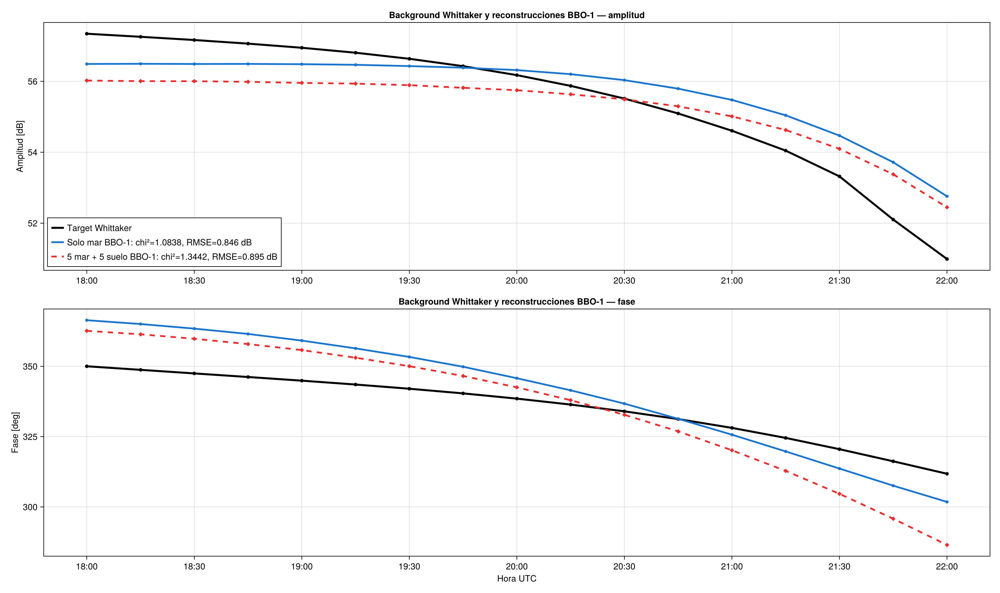

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/01_reconstructions_seawater_vs_ocean5_goodsoil5.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/01_reconstructions_seawater_vs_ocean5_goodsoil5.pdf")

In [10]:
################################################################################
# 5. Series temporales reconstruidas:
#    target Whittaker, BBO-1 oceánica y BBO-1 heterogénea
################################################################################

fig_reconstructions = CM.Figure(size = (1600, 950))

ax_A_reco = CM.Axis(
    fig_reconstructions[1, 1],
    title = "Background Whittaker y reconstrucciones BBO-1 — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (xtick_hours, xtick_labels),
)

CM.lines!(
    ax_A_reco,
    t_hours,
    target_A;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_A_reco,
    t_hours,
    target_A;
    color = :black,
    markersize = 8,
)

CM.lines!(
    ax_A_reco,
    t_hours,
    ocean.reco_A;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = @sprintf(
        "Solo mar BBO-1: chi²=%.4f, RMSE=%.3f dB",
        m_ocean_reco.chi_total,
        m_ocean_reco.RMSE_A_dB,
    ),
)

CM.scatter!(
    ax_A_reco,
    t_hours,
    ocean.reco_A;
    color = :dodgerblue3,
    markersize = 7,
)

CM.lines!(
    ax_A_reco,
    t_hours,
    hetero.reco_A;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = @sprintf(
        "5 mar + 5 suelo BBO-1: chi²=%.4f, RMSE=%.3f dB",
        m_hetero_reco.chi_total,
        m_hetero_reco.RMSE_A_dB,
    ),
)

CM.scatter!(
    ax_A_reco,
    t_hours,
    hetero.reco_A;
    color = :firebrick2,
    marker = :diamond,
    markersize = 8,
)

CM.axislegend(
    ax_A_reco;
    position = :lb,
    nbanks = 1,
)

ax_phi_reco = CM.Axis(
    fig_reconstructions[2, 1],
    title = "Background Whittaker y reconstrucciones BBO-1 — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (xtick_hours, xtick_labels),
)

CM.lines!(
    ax_phi_reco,
    t_hours,
    target_phi;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_phi_reco,
    t_hours,
    target_phi;
    color = :black,
    markersize = 8,
)

CM.lines!(
    ax_phi_reco,
    t_hours,
    ocean.reco_phi;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = @sprintf(
        "Solo mar BBO-1: chi²_phi=%.4f, RMSE=%.3f deg",
        m_ocean_reco.chi_phi,
        m_ocean_reco.RMSE_phi_deg,
    ),
)

CM.scatter!(
    ax_phi_reco,
    t_hours,
    ocean.reco_phi;
    color = :dodgerblue3,
    markersize = 7,
)

CM.lines!(
    ax_phi_reco,
    t_hours,
    hetero.reco_phi;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = @sprintf(
        "5 mar + 5 suelo BBO-1: chi²_phi=%.4f, RMSE=%.3f deg",
        m_hetero_reco.chi_phi,
        m_hetero_reco.RMSE_phi_deg,
    ),
)

CM.scatter!(
    ax_phi_reco,
    t_hours,
    hetero.reco_phi;
    color = :firebrick2,
    marker = :diamond,
    markersize = 8,
)

CM.linkxaxes!(ax_A_reco, ax_phi_reco)
CM.xlims!(ax_A_reco, 18, 22)

reconstruction_png = joinpath(
    FIGURE_DIR,
    "01_reconstructions_seawater_vs_ocean5_goodsoil5.png",
)

reconstruction_pdf = joinpath(
    FIGURE_DIR,
    "01_reconstructions_seawater_vs_ocean5_goodsoil5.pdf",
)

CM.save(reconstruction_png, fig_reconstructions)
CM.save(reconstruction_pdf, fig_reconstructions)

display(fig_reconstructions)

(reconstruction_png, reconstruction_pdf)

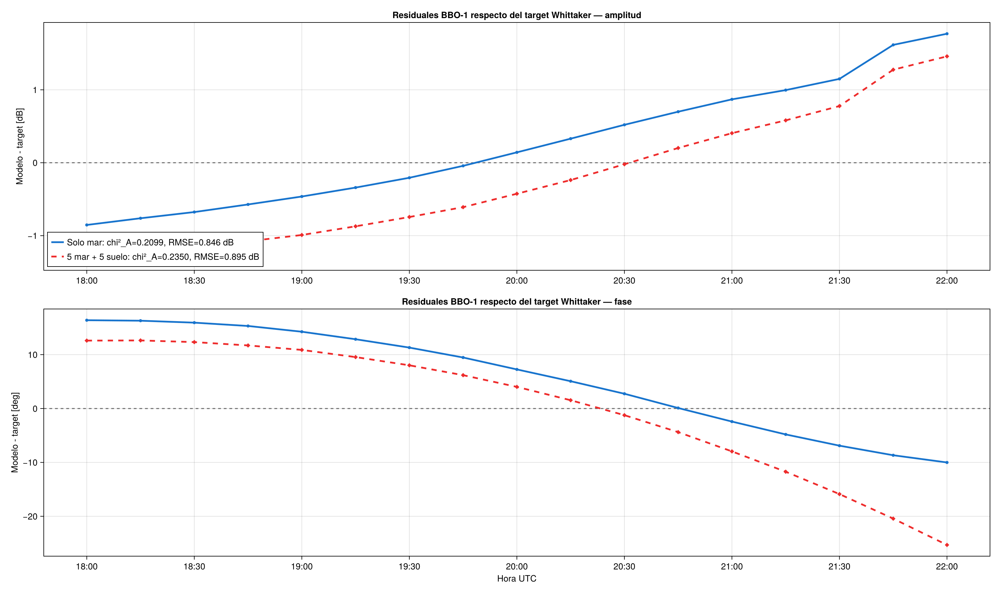

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/02_residuals_seawater_vs_ocean5_goodsoil5.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/02_residuals_seawater_vs_ocean5_goodsoil5.pdf")

In [11]:
################################################################################
# 6. Residuales de las reconstrucciones respecto del target Whittaker
################################################################################

residual_A_ocean = ocean.reco_A .- target_A
residual_phi_ocean = ocean.reco_phi .- target_phi

residual_A_hetero = hetero.reco_A .- target_A
residual_phi_hetero = hetero.reco_phi .- target_phi

fig_residuals = CM.Figure(size = (1600, 950))

ax_A_residual = CM.Axis(
    fig_residuals[1, 1],
    title = "Residuales BBO-1 respecto del target Whittaker — amplitud",
    ylabel = "Modelo - target [dB]",
    xticks = (xtick_hours, xtick_labels),
)

CM.hlines!(
    ax_A_residual,
    [0.0];
    color = :gray40,
    linestyle = :dash,
    linewidth = 1.5,
)

CM.lines!(
    ax_A_residual,
    t_hours,
    residual_A_ocean;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = @sprintf(
        "Solo mar: chi²_A=%.4f, RMSE=%.3f dB",
        m_ocean_reco.chi_A,
        m_ocean_reco.RMSE_A_dB,
    ),
)

CM.scatter!(
    ax_A_residual,
    t_hours,
    residual_A_ocean;
    color = :dodgerblue3,
    markersize = 7,
)

CM.lines!(
    ax_A_residual,
    t_hours,
    residual_A_hetero;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = @sprintf(
        "5 mar + 5 suelo: chi²_A=%.4f, RMSE=%.3f dB",
        m_hetero_reco.chi_A,
        m_hetero_reco.RMSE_A_dB,
    ),
)

CM.scatter!(
    ax_A_residual,
    t_hours,
    residual_A_hetero;
    color = :firebrick2,
    marker = :diamond,
    markersize = 8,
)

CM.axislegend(
    ax_A_residual;
    position = :lb,
)

ax_phi_residual = CM.Axis(
    fig_residuals[2, 1],
    title = "Residuales BBO-1 respecto del target Whittaker — fase",
    xlabel = "Hora UTC",
    ylabel = "Modelo - target [deg]",
    xticks = (xtick_hours, xtick_labels),
)

CM.hlines!(
    ax_phi_residual,
    [0.0];
    color = :gray40,
    linestyle = :dash,
    linewidth = 1.5,
)

CM.lines!(
    ax_phi_residual,
    t_hours,
    residual_phi_ocean;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = @sprintf(
        "Solo mar: chi²_phi=%.4f, RMSE=%.3f deg",
        m_ocean_reco.chi_phi,
        m_ocean_reco.RMSE_phi_deg,
    ),
)

CM.scatter!(
    ax_phi_residual,
    t_hours,
    residual_phi_ocean;
    color = :dodgerblue3,
    markersize = 7,
)

CM.lines!(
    ax_phi_residual,
    t_hours,
    residual_phi_hetero;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = @sprintf(
        "5 mar + 5 suelo: chi²_phi=%.4f, RMSE=%.3f deg",
        m_hetero_reco.chi_phi,
        m_hetero_reco.RMSE_phi_deg,
    ),
)

CM.scatter!(
    ax_phi_residual,
    t_hours,
    residual_phi_hetero;
    color = :firebrick2,
    marker = :diamond,
    markersize = 8,
)

CM.linkxaxes!(ax_A_residual, ax_phi_residual)
CM.xlims!(ax_A_residual, 18, 22)

residuals_png = joinpath(
    FIGURE_DIR,
    "02_residuals_seawater_vs_ocean5_goodsoil5.png",
)

residuals_pdf = joinpath(
    FIGURE_DIR,
    "02_residuals_seawater_vs_ocean5_goodsoil5.pdf",
)

CM.save(residuals_png, fig_residuals)
CM.save(residuals_pdf, fig_residuals)

display(fig_residuals)

(residuals_png, residuals_pdf)

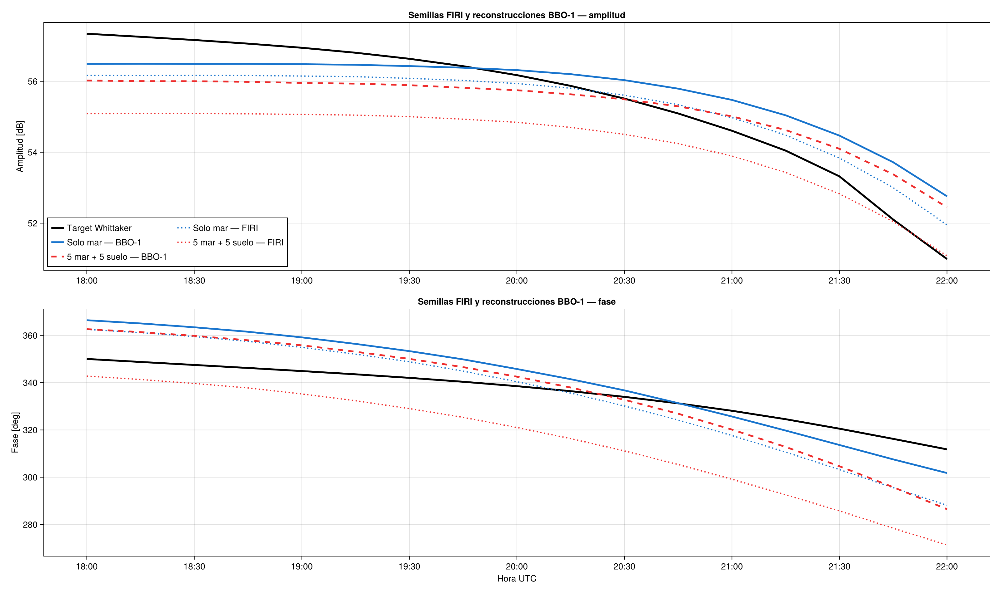

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/03_seed_and_reconstruction_comparison.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/03_seed_and_reconstruction_comparison.pdf")

In [12]:
################################################################################
# 7. Semillas FIRI y reconstrucciones BBO-1 de ambos escenarios
################################################################################

fig_seed_reco = CM.Figure(size = (1600, 950))

ax_A_seed_reco = CM.Axis(
    fig_seed_reco[1, 1],
    title = "Semillas FIRI y reconstrucciones BBO-1 — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (xtick_hours, xtick_labels),
)

CM.lines!(
    ax_A_seed_reco,
    t_hours,
    target_A;
    color = :black,
    linewidth = 3.0,
    label = "Target Whittaker",
)

CM.lines!(
    ax_A_seed_reco,
    t_hours,
    ocean.seed_A;
    color = :dodgerblue3,
    linewidth = 2.0,
    linestyle = :dot,
    label = "Solo mar — FIRI",
)

CM.lines!(
    ax_A_seed_reco,
    t_hours,
    ocean.reco_A;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Solo mar — BBO-1",
)

CM.lines!(
    ax_A_seed_reco,
    t_hours,
    hetero.seed_A;
    color = :firebrick2,
    linewidth = 2.0,
    linestyle = :dot,
    label = "5 mar + 5 suelo — FIRI",
)

CM.lines!(
    ax_A_seed_reco,
    t_hours,
    hetero.reco_A;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "5 mar + 5 suelo — BBO-1",
)

CM.axislegend(
    ax_A_seed_reco;
    position = :lb,
    nbanks = 2,
)

ax_phi_seed_reco = CM.Axis(
    fig_seed_reco[2, 1],
    title = "Semillas FIRI y reconstrucciones BBO-1 — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (xtick_hours, xtick_labels),
)

CM.lines!(
    ax_phi_seed_reco,
    t_hours,
    target_phi;
    color = :black,
    linewidth = 3.0,
    label = "Target Whittaker",
)

CM.lines!(
    ax_phi_seed_reco,
    t_hours,
    ocean.seed_phi;
    color = :dodgerblue3,
    linewidth = 2.0,
    linestyle = :dot,
    label = "Solo mar — FIRI",
)

CM.lines!(
    ax_phi_seed_reco,
    t_hours,
    ocean.reco_phi;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Solo mar — BBO-1",
)

CM.lines!(
    ax_phi_seed_reco,
    t_hours,
    hetero.seed_phi;
    color = :firebrick2,
    linewidth = 2.0,
    linestyle = :dot,
    label = "5 mar + 5 suelo — FIRI",
)

CM.lines!(
    ax_phi_seed_reco,
    t_hours,
    hetero.reco_phi;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "5 mar + 5 suelo — BBO-1",
)

CM.linkxaxes!(ax_A_seed_reco, ax_phi_seed_reco)
CM.xlims!(ax_A_seed_reco, 18, 22)

seed_reco_png = joinpath(
    FIGURE_DIR,
    "03_seed_and_reconstruction_comparison.png",
)

seed_reco_pdf = joinpath(
    FIGURE_DIR,
    "03_seed_and_reconstruction_comparison.pdf",
)

CM.save(seed_reco_png, fig_seed_reco)
CM.save(seed_reco_pdf, fig_seed_reco)

display(fig_seed_reco)

(seed_reco_png, seed_reco_pdf)

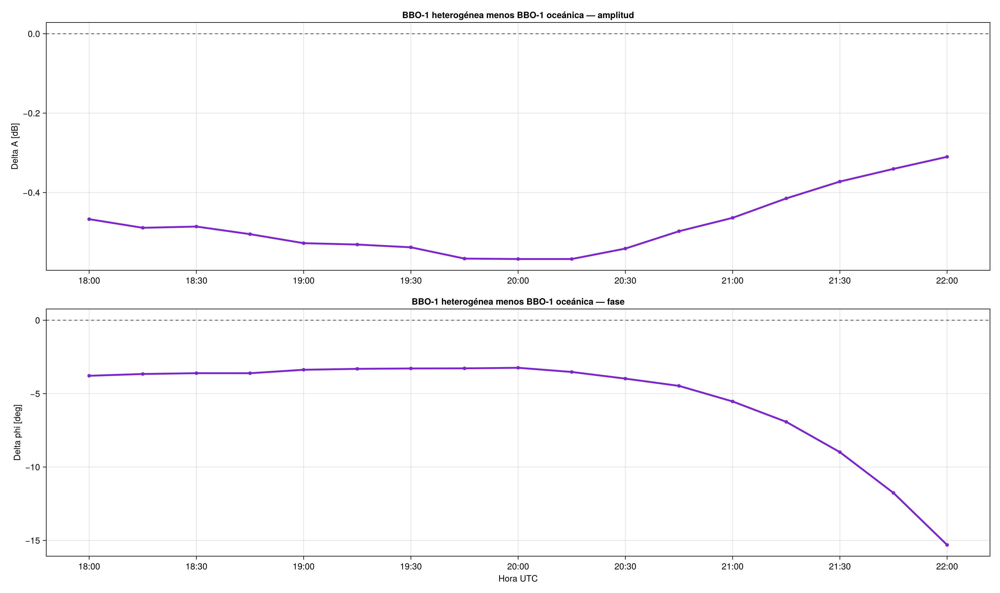

LoadError: LoadError: ArgumentError: First argument to `@printf` after `io` must be a format string
in expression starting at In[13]:105

In [13]:
################################################################################
# 8. Diferencia directa entre las dos reconstrucciones BBO-1
################################################################################

delta_A_hetero_minus_ocean = hetero.reco_A .- ocean.reco_A
delta_phi_hetero_minus_ocean = hetero.reco_phi .- ocean.reco_phi

fig_direct_difference = CM.Figure(size = (1600, 950))

ax_delta_A = CM.Axis(
    fig_direct_difference[1, 1],
    title = "BBO-1 heterogénea menos BBO-1 oceánica — amplitud",
    ylabel = "Delta A [dB]",
    xticks = (xtick_hours, xtick_labels),
)

CM.hlines!(
    ax_delta_A,
    [0.0];
    color = :gray40,
    linestyle = :dash,
)

CM.lines!(
    ax_delta_A,
    t_hours,
    delta_A_hetero_minus_ocean;
    color = :purple3,
    linewidth = 3.0,
)

CM.scatter!(
    ax_delta_A,
    t_hours,
    delta_A_hetero_minus_ocean;
    color = :purple3,
    markersize = 8,
)

ax_delta_phi = CM.Axis(
    fig_direct_difference[2, 1],
    title = "BBO-1 heterogénea menos BBO-1 oceánica — fase",
    xlabel = "Hora UTC",
    ylabel = "Delta phi [deg]",
    xticks = (xtick_hours, xtick_labels),
)

CM.hlines!(
    ax_delta_phi,
    [0.0];
    color = :gray40,
    linestyle = :dash,
)

CM.lines!(
    ax_delta_phi,
    t_hours,
    delta_phi_hetero_minus_ocean;
    color = :purple3,
    linewidth = 3.0,
)

CM.scatter!(
    ax_delta_phi,
    t_hours,
    delta_phi_hetero_minus_ocean;
    color = :purple3,
    markersize = 8,
)

CM.linkxaxes!(ax_delta_A, ax_delta_phi)
CM.xlims!(ax_delta_A, 18, 22)

direct_difference_png = joinpath(
    FIGURE_DIR,
    "04_heterogeneous_minus_seawater_reconstruction.png",
)

direct_difference_pdf = joinpath(
    FIGURE_DIR,
    "04_heterogeneous_minus_seawater_reconstruction.pdf",
)

CM.save(direct_difference_png, fig_direct_difference)
CM.save(direct_difference_pdf, fig_direct_difference)

display(fig_direct_difference)

df_direct_difference = DataFrame(
    time_UTC = string.(ocean.zdt),
    delta_A_heterogeneous_minus_ocean_dB =
        delta_A_hetero_minus_ocean,
    delta_phi_heterogeneous_minus_ocean_deg =
        delta_phi_hetero_minus_ocean,
)

CSV.write(
    joinpath(
        FIGURE_DIR,
        "heterogeneous_minus_seawater_reconstruction.csv",
    ),
    df_direct_difference,
)

@printf(
    "\nDiferencia directa heterogéneo - océano:\n" *
    "  mean Delta A   = %+0.6f dB\n" *
    "  RMSE Delta A   = %0.6f dB\n" *
    "  mean Delta phi = %+0.6f deg\n" *
    "  RMSE Delta phi = %0.6f deg\n",
    mean(delta_A_hetero_minus_ocean),
    sqrt(mean(delta_A_hetero_minus_ocean .^ 2)),
    mean(delta_phi_hetero_minus_ocean),
    sqrt(mean(delta_phi_hetero_minus_ocean .^ 2)),
)

(direct_difference_png, direct_difference_pdf)

In [14]:
################################################################################
# 9. Comparación de coeficientes y cercanía a los límites de búsqueda
################################################################################

function relative_change_percent(best, seed)
    return 100 .* (best .- seed) ./ abs.(seed)
end

function bound_position(best, lower, upper)
    width = upper .- lower

    lower_fraction = (best .- lower) ./ width
    upper_fraction = (upper .- best) ./ width

    nearest_bound_fraction = min.(lower_fraction, upper_fraction)

    return (
        lower_fraction = lower_fraction,
        upper_fraction = upper_fraction,
        nearest_bound_fraction = nearest_bound_fraction,
    )
end

ocean_bound = bound_position(
    ocean.reco_params,
    ocean.search_lower,
    ocean.search_upper,
)

hetero_bound = bound_position(
    hetero.reco_params,
    hetero.search_lower,
    hetero.search_upper,
)

df_parameters = DataFrame(
    parameter = parameter_names,

    ocean_seed = ocean.seed_params,
    ocean_BBO1 = ocean.reco_params,
    ocean_relative_change_percent = relative_change_percent(
        ocean.reco_params,
        ocean.seed_params,
    ),
    ocean_nearest_bound_fraction =
        ocean_bound.nearest_bound_fraction,

    heterogeneous_seed = hetero.seed_params,
    heterogeneous_BBO1 = hetero.reco_params,
    heterogeneous_relative_change_percent = relative_change_percent(
        hetero.reco_params,
        hetero.seed_params,
    ),
    heterogeneous_nearest_bound_fraction =
        hetero_bound.nearest_bound_fraction,

    heterogeneous_minus_ocean_BBO1 =
        hetero.reco_params .- ocean.reco_params,
)

CSV.write(
    joinpath(FIGURE_DIR, "parameter_comparison.csv"),
    df_parameters,
)

display(df_parameters)

println(
    "\nParámetros heterogéneos a menos del 5 % del ancho total " *
    "respecto del límite más cercano:"
)

display(
    filter(
        :heterogeneous_nearest_bound_fraction =>
            x -> x <= 0.05,
        df_parameters,
    )
)

Row,parameter,ocean_seed,ocean_BBO1,ocean_relative_change_percent,ocean_nearest_bound_fraction,heterogeneous_seed,heterogeneous_BBO1,heterogeneous_relative_change_percent,heterogeneous_nearest_bound_fraction,heterogeneous_minus_ocean_BBO1
,SubStrin…,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,h_c0,70.9316,70.5195,-0.580948,0.463691,70.9316,69.3597,-2.21604,0.361497,-1.1598
2,h_c1,0.023626,0.0241275,2.12243,0.367348,0.023626,0.0254086,7.54491,0.0284432,0.00128111
3,h_c2,0.630944,0.644314,2.11904,0.36756,0.630944,0.60913,-3.45737,0.283914,-0.035184
4,h_c3,-0.117236,-0.108591,7.37433,0.0391047,-0.117236,-0.108489,7.46073,0.0337045,0.000101295
5,h_c4,1.78178,1.64575,-7.63425,0.0228594,1.78178,1.76566,-0.904417,0.443474,0.11991
6,h_c5,0.179863,0.19364,7.66012,0.0212423,0.179863,0.185975,3.39825,0.287609,-0.00766552
7,h_c6,-0.718316,-0.719073,-0.105362,0.493415,-0.718316,-0.682157,5.03391,0.185381,0.0369162
8,h_c7,-0.0723804,-0.0779816,-7.7385,0.0163436,-0.0723804,-0.078139,-7.95592,0.00275481,-0.000157371
9,h_c8,0.293649,0.290722,-0.996726,0.437705,0.293649,0.296813,1.07745,0.432659,0.0060908



Parámetros heterogéneos a menos del 5 % del ancho total respecto del límite más cercano:


Row,parameter,ocean_seed,ocean_BBO1,ocean_relative_change_percent,ocean_nearest_bound_fraction,heterogeneous_seed,heterogeneous_BBO1,heterogeneous_relative_change_percent,heterogeneous_nearest_bound_fraction,heterogeneous_minus_ocean_BBO1
,SubStrin…,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,h_c1,0.023626,0.0241275,2.12243,0.367348,0.023626,0.0254086,7.54491,0.0284432,0.00128111
2,h_c3,-0.117236,-0.108591,7.37433,0.0391047,-0.117236,-0.108489,7.46073,0.0337045,0.000101295
3,h_c7,-0.0723804,-0.0779816,-7.7385,0.0163436,-0.0723804,-0.078139,-7.95592,0.00275481,-0.000157371
4,beta_c3,0.0062624,0.00669174,6.85579,0.0715134,0.0062624,0.00675936,7.9355,0.00403133,6.7616e-5
5,beta_c4,-0.0371977,-0.039941,-7.37492,0.0390675,-0.0371977,-0.0400772,-7.741,0.0161877,-0.000136173
6,beta_c5,-0.00380827,-0.00374519,1.65655,0.396466,-0.00380827,-0.00410252,-7.72641,0.0170992,-0.000357329


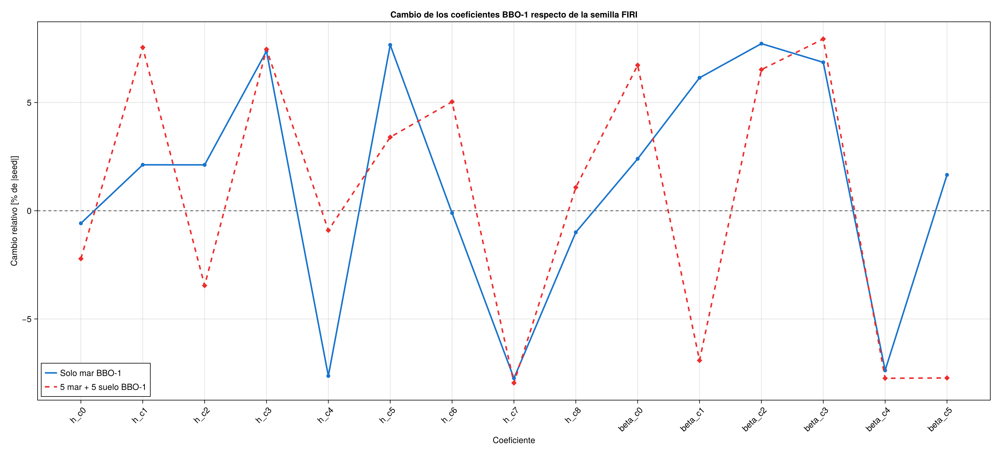

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/05_parameter_relative_changes.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/05_parameter_relative_changes.pdf")

In [15]:
################################################################################
# 10. Visualización del cambio relativo de los coeficientes
################################################################################

parameter_index = collect(1:length(parameter_names))

fig_parameters = CM.Figure(size = (1650, 750))

ax_parameters = CM.Axis(
    fig_parameters[1, 1],
    title = "Cambio de los coeficientes BBO-1 respecto de la semilla FIRI",
    xlabel = "Coeficiente",
    ylabel = "Cambio relativo [% de |seed|]",
    xticks = (
        parameter_index,
        parameter_names,
    ),
    xticklabelrotation = π / 4,
)

CM.hlines!(
    ax_parameters,
    [0.0];
    color = :gray40,
    linestyle = :dash,
)

CM.lines!(
    ax_parameters,
    parameter_index,
    df_parameters.ocean_relative_change_percent;
    color = :dodgerblue3,
    linewidth = 2.5,
    label = "Solo mar BBO-1",
)

CM.scatter!(
    ax_parameters,
    parameter_index,
    df_parameters.ocean_relative_change_percent;
    color = :dodgerblue3,
    markersize = 9,
)

CM.lines!(
    ax_parameters,
    parameter_index,
    df_parameters.heterogeneous_relative_change_percent;
    color = :firebrick2,
    linewidth = 2.5,
    linestyle = :dash,
    label = "5 mar + 5 suelo BBO-1",
)

CM.scatter!(
    ax_parameters,
    parameter_index,
    df_parameters.heterogeneous_relative_change_percent;
    color = :firebrick2,
    marker = :diamond,
    markersize = 10,
)

CM.axislegend(
    ax_parameters;
    position = :lb,
)

parameter_png = joinpath(
    FIGURE_DIR,
    "05_parameter_relative_changes.png",
)

parameter_pdf = joinpath(
    FIGURE_DIR,
    "05_parameter_relative_changes.pdf",
)

CM.save(parameter_png, fig_parameters)
CM.save(parameter_pdf, fig_parameters)

display(fig_parameters)

(parameter_png, parameter_pdf)

In [16]:
################################################################################
# 11. Resumen automático de la comparación BBO-1
################################################################################

total_relative_change_percent =
    100 * (
        m_hetero_reco.chi_total / m_ocean_reco.chi_total - 1
    )

phase_relative_change_percent =
    100 * (
        m_hetero_reco.chi_phi / m_ocean_reco.chi_phi - 1
    )

amplitude_relative_change_percent =
    100 * (
        m_hetero_reco.chi_A / m_ocean_reco.chi_A - 1
    )

println("="^86)
println("RESUMEN — WHITTAKER BBO-1")
println("="^86)

@printf(
    "Solo mar:\n" *
    "  chi_A     = %.8f\n" *
    "  chi_phi   = %.8f\n" *
    "  chi_total = %.8f\n" *
    "  RMSE_A    = %.6f dB\n" *
    "  RMSE_phi  = %.6f deg\n\n",
    m_ocean_reco.chi_A,
    m_ocean_reco.chi_phi,
    m_ocean_reco.chi_total,
    m_ocean_reco.RMSE_A_dB,
    m_ocean_reco.RMSE_phi_deg,
)

@printf(
    "5 mar + 5 buen suelo:\n" *
    "  chi_A     = %.8f\n" *
    "  chi_phi   = %.8f\n" *
    "  chi_total = %.8f\n" *
    "  RMSE_A    = %.6f dB\n" *
    "  RMSE_phi  = %.6f deg\n\n",
    m_hetero_reco.chi_A,
    m_hetero_reco.chi_phi,
    m_hetero_reco.chi_total,
    m_hetero_reco.RMSE_A_dB,
    m_hetero_reco.RMSE_phi_deg,
)

@printf(
    "Cambio relativo heterogéneo respecto de solo mar:\n" *
    "  chi_A:     %+0.2f %%\n" *
    "  chi_phi:   %+0.2f %%\n" *
    "  chi_total: %+0.2f %%\n",
    amplitude_relative_change_percent,
    phase_relative_change_percent,
    total_relative_change_percent,
)

println("\nDirectorio con todas las figuras y CSV:")
println(FIGURE_DIR)
println("="^86)

RESUMEN — WHITTAKER BBO-1


LoadError: LoadError: ArgumentError: First argument to `@printf` after `io` must be a format string
in expression starting at In[16]:24

## Criterio de interpretación

La comparación principal debe hacerse entre las dos filas **BBO-1**, no entre las mejoras relativas respecto de sus respectivas semillas.

Una reducción grande desde la semilla heterogénea no implica automáticamente que el escenario heterogéneo sea superior, porque esa semilla puede estar inicialmente mucho más alejada del target. La pregunta decisiva es:

\[
\chi^2_{\mathrm{BBO1,heterogéneo}}
\stackrel{?}{<}
\chi^2_{\mathrm{BBO1,océano}}.
\]

También deben examinarse por separado:

\[
\chi_A^2,\qquad
\chi_\phi^2,\qquad
\mathrm{RMSE}_A,\qquad
\mathrm{RMSE}_\phi,
\]

así como la forma temporal de los residuales. Un offset medio pequeño no garantiza una buena reconstrucción si permanece una pendiente o curvatura sistemática.

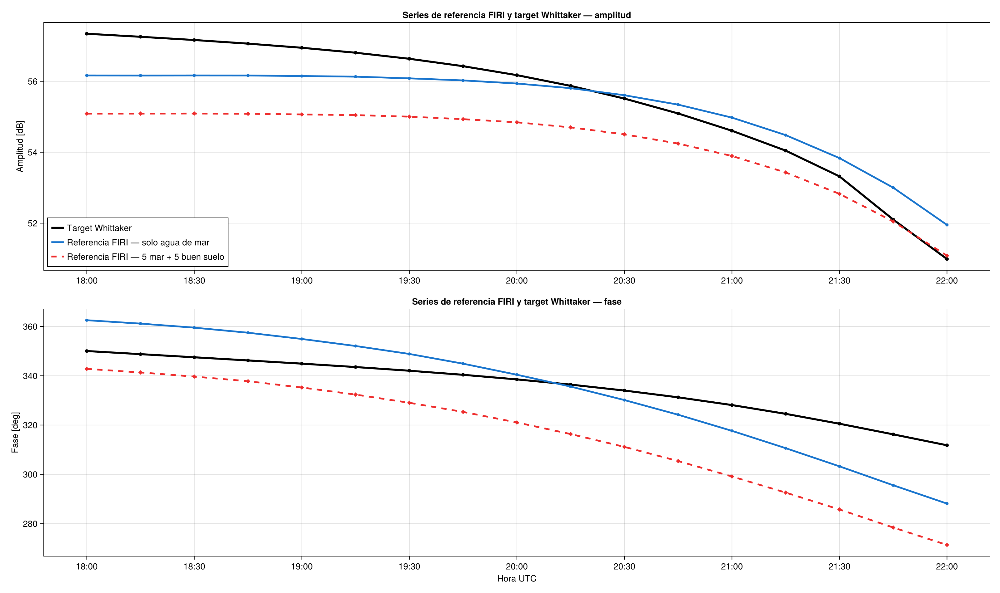

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/06_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_target.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/06_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_target.pdf")

In [17]:
################################################################################
# Series de referencia FIRI:
# solo agua de mar vs 5 mar + 5 buen suelo vs target Whittaker
################################################################################

fig_reference_vs_target = CM.Figure(
    size = (1600, 950),
)

# ------------------------------------------------------------------------------
# Amplitud
# ------------------------------------------------------------------------------

ax_reference_A = CM.Axis(
    fig_reference_vs_target[1, 1],
    title = "Series de referencia FIRI y target Whittaker — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (
        xtick_hours,
        xtick_labels,
    ),
)

CM.lines!(
    ax_reference_A,
    t_hours,
    target_A;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_reference_A,
    t_hours,
    target_A;
    color = :black,
    markersize = 8,
)

CM.lines!(
    ax_reference_A,
    t_hours,
    ocean.seed_A;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.scatter!(
    ax_reference_A,
    t_hours,
    ocean.seed_A;
    color = :dodgerblue3,
    markersize = 7,
)

CM.lines!(
    ax_reference_A,
    t_hours,
    hetero.seed_A;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "Referencia FIRI — 5 mar + 5 buen suelo",
)

CM.scatter!(
    ax_reference_A,
    t_hours,
    hetero.seed_A;
    color = :firebrick2,
    marker = :diamond,
    markersize = 8,
)

CM.axislegend(
    ax_reference_A;
    position = :lb,
    nbanks = 1,
)

# ------------------------------------------------------------------------------
# Fase
# ------------------------------------------------------------------------------

ax_reference_phi = CM.Axis(
    fig_reference_vs_target[2, 1],
    title = "Series de referencia FIRI y target Whittaker — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (
        xtick_hours,
        xtick_labels,
    ),
)

CM.lines!(
    ax_reference_phi,
    t_hours,
    target_phi;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_reference_phi,
    t_hours,
    target_phi;
    color = :black,
    markersize = 8,
)

CM.lines!(
    ax_reference_phi,
    t_hours,
    ocean.seed_phi;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.scatter!(
    ax_reference_phi,
    t_hours,
    ocean.seed_phi;
    color = :dodgerblue3,
    markersize = 7,
)

CM.lines!(
    ax_reference_phi,
    t_hours,
    hetero.seed_phi;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "Referencia FIRI — 5 mar + 5 buen suelo",
)

CM.scatter!(
    ax_reference_phi,
    t_hours,
    hetero.seed_phi;
    color = :firebrick2,
    marker = :diamond,
    markersize = 8,
)

# ------------------------------------------------------------------------------
# Formato común y guardado
# ------------------------------------------------------------------------------

CM.linkxaxes!(
    ax_reference_A,
    ax_reference_phi,
)

CM.xlims!(
    ax_reference_A,
    18,
    22,
)

reference_vs_target_png = joinpath(
    FIGURE_DIR,
    "06_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_target.png",
)

reference_vs_target_pdf = joinpath(
    FIGURE_DIR,
    "06_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_target.pdf",
)

CM.save(
    reference_vs_target_png,
    fig_reference_vs_target,
)

CM.save(
    reference_vs_target_pdf,
    fig_reference_vs_target,
)

display(fig_reference_vs_target)

(
    reference_vs_target_png,
    reference_vs_target_pdf,
)

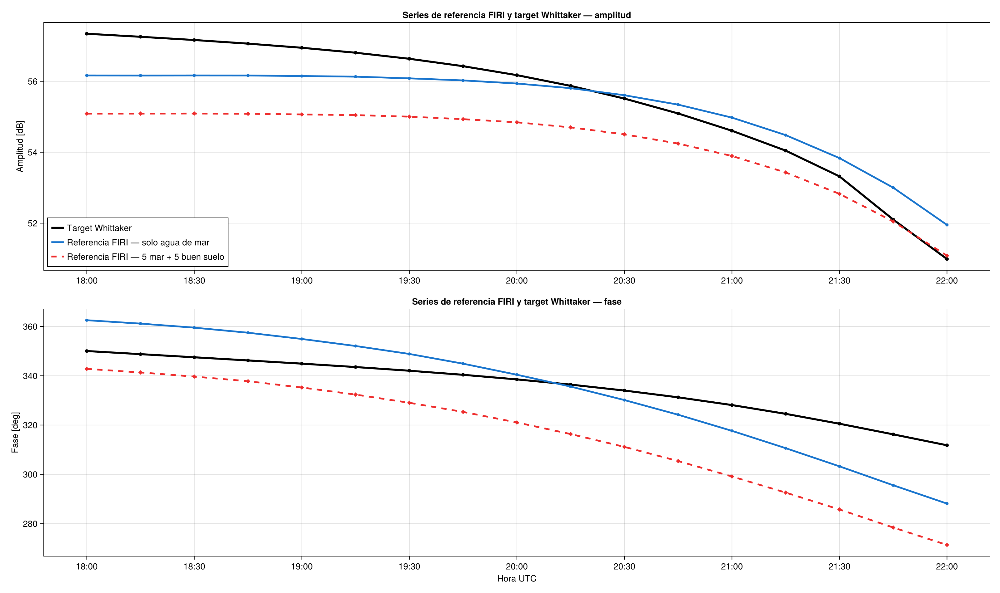

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/06_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_target.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/06_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_target.pdf")

Referencias FIRI:
  /home/jp/basefolder_JP/outputs_reference_efield_firi_10waveguides_13ground_cases_20080325/reference_efield_firi_NAA_PLO_10wg_13ground_cases_20080325.jld2

Target Whittaker:
  /home/jp/basefolder_JP/real_whittaker_selected_background_16_22_for_inversion.h5

Rango disponible de las referencias: 2008-03-25T11:00:00+00:00 → 2008-03-25T22:00:00+00:00
Rango disponible del target Whittaker: 2008-03-25T16:00:00+00:00 → 2008-03-25T22:00:00+00:00


┌ Warning: El target Whittaker no existe antes de 2008-03-25T16:00:00+00:00. No se extrapolará entre 11:00 y ese instante.
└ @ Main In[19]:245


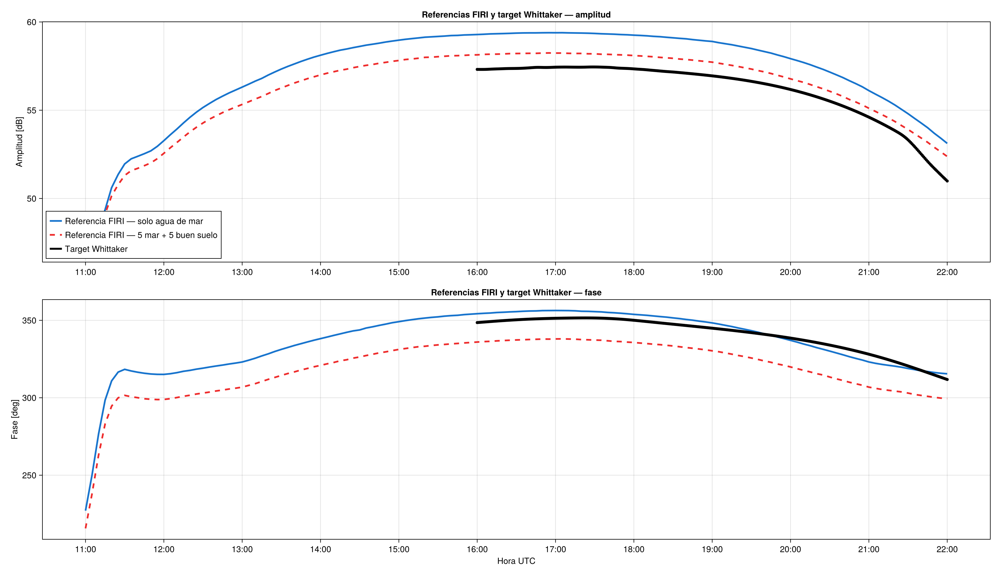

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_11_22.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_11_22.pdf")

In [19]:
################################################################################
# Series de referencia FIRI entre 11:00 y 22:00 UTC:
# solo agua de mar vs 5 mar + 5 buen suelo vs target Whittaker disponible
################################################################################

using JLD2

# ------------------------------------------------------------------------------
# 1. Localizar los archivos que contienen las series completas
# ------------------------------------------------------------------------------

reference_consolidated_file = find_unique_file(
    ROOT_DIR,
    "reference_efield_firi_NAA_PLO_10wg_13ground_cases_20080325.jld2",
)

whittaker_background_file = find_unique_file(
    ROOT_DIR,
    "real_whittaker_selected_background_16_22_for_inversion.h5",
)

println("Referencias FIRI:")
println("  ", reference_consolidated_file)

println("\nTarget Whittaker:")
println("  ", whittaker_background_file)

# ------------------------------------------------------------------------------
# 2. Cargar las referencias FIRI completas
# ------------------------------------------------------------------------------

reference_data = JLD2.load(
    reference_consolidated_file,
)

reference_case_keys = String.(
    vec(reference_data["case_keys"])
)

reference_zdt = collect(
    vec(reference_data["zdt"])
)

N_reference_cases = length(reference_case_keys)
N_reference_times = length(reference_zdt)

reference_A = Float64.(
    Array(reference_data["amplitude_matrix_dB"])
)

reference_phi_deg = Float64.(
    Array(reference_data["phase_unwrapped_matrix_deg"])
)

# Orientar las matrices como caso × tiempo.
if size(reference_A) == (
    N_reference_times,
    N_reference_cases,
)
    reference_A = permutedims(reference_A)
elseif size(reference_A) != (
    N_reference_cases,
    N_reference_times,
)
    error(
        "Dimensiones inesperadas para amplitude_matrix_dB: " *
        "$(size(reference_A))"
    )
end

if size(reference_phi_deg) == (
    N_reference_times,
    N_reference_cases,
)
    reference_phi_deg = permutedims(reference_phi_deg)
elseif size(reference_phi_deg) != (
    N_reference_cases,
    N_reference_times,
)
    error(
        "Dimensiones inesperadas para phase_unwrapped_matrix_deg: " *
        "$(size(reference_phi_deg))"
    )
end

ocean_reference_index = findfirst(
    ==("ground_10"),
    reference_case_keys,
)

heterogeneous_reference_index = findfirst(
    ==("ocean5_goodsoil5"),
    reference_case_keys,
)

ocean_reference_index === nothing && error(
    "No se encontró el caso ground_10."
)

heterogeneous_reference_index === nothing && error(
    "No se encontró el caso ocean5_goodsoil5."
)

reference_hours = [
    hour(DateTime(t)) +
    minute(DateTime(t)) / 60 +
    second(DateTime(t)) / 3600
    for t in reference_zdt
]

reference_indices_11_22 = findall(
    h -> 11.0 <= h <= 22.0,
    reference_hours,
)

isempty(reference_indices_11_22) && error(
    "Las referencias no contienen datos entre 11:00 y 22:00 UTC."
)

reference_hours_11_22 =
    reference_hours[reference_indices_11_22]

ocean_reference_A_11_22 =
    reference_A[
        ocean_reference_index,
        reference_indices_11_22,
    ]

heterogeneous_reference_A_11_22 =
    reference_A[
        heterogeneous_reference_index,
        reference_indices_11_22,
    ]

ocean_reference_phi_11_22 =
    reference_phi_deg[
        ocean_reference_index,
        reference_indices_11_22,
    ]

heterogeneous_reference_phi_11_22 =
    reference_phi_deg[
        heterogeneous_reference_index,
        reference_indices_11_22,
    ]

# ------------------------------------------------------------------------------
# 3. Cargar el background Whittaker completo disponible
# ------------------------------------------------------------------------------

whittaker_timestamps_unix = Float64.(
    vec(
        h5read(
            whittaker_background_file,
            "timestamps_unix",
        )
    )
)

whittaker_zdt = ZonedDateTime.(
    unix2datetime.(whittaker_timestamps_unix),
    Ref(tz"UTC"),
)

whittaker_A_raw = Float64.(
    vec(
        h5read(
            whittaker_background_file,
            "A_background",
        )
    )
)

whittaker_phi_raw = Float64.(
    vec(
        h5read(
            whittaker_background_file,
            "phi_background",
        )
    )
)

# Usar exactamente las correcciones instrumentales de la inversión.
amp_offset_db = Float64(
    read_attribute(
        OCEAN_H5,
        nothing,
        "amp_offset_db_used";
        default = 19.0,
    )
)

phi_offset_deg = Float64(
    read_attribute(
        OCEAN_H5,
        nothing,
        "phi_offset_deg_used";
        default = -210.0,
    )
)

whittaker_A = whittaker_A_raw .+ amp_offset_db
whittaker_phi = whittaker_phi_raw .+ phi_offset_deg

whittaker_hours = [
    hour(DateTime(t)) +
    minute(DateTime(t)) / 60 +
    second(DateTime(t)) / 3600
    for t in whittaker_zdt
]

whittaker_indices_11_22 = findall(
    h -> 11.0 <= h <= 22.0,
    whittaker_hours,
)

isempty(whittaker_indices_11_22) && error(
    "El archivo Whittaker no contiene muestras dentro de 11:00–22:00 UTC."
)

whittaker_hours_available =
    whittaker_hours[whittaker_indices_11_22]

whittaker_A_available =
    whittaker_A[whittaker_indices_11_22]

whittaker_phi_available =
    whittaker_phi[whittaker_indices_11_22]

println(
    "\nRango disponible de las referencias: ",
    first(reference_zdt[reference_indices_11_22]),
    " → ",
    last(reference_zdt[reference_indices_11_22]),
)

println(
    "Rango disponible del target Whittaker: ",
    first(whittaker_zdt[whittaker_indices_11_22]),
    " → ",
    last(whittaker_zdt[whittaker_indices_11_22]),
)

if first(whittaker_hours_available) > 11.0
    @warn(
        "El target Whittaker no existe antes de " *
        "$(first(whittaker_zdt[whittaker_indices_11_22])). " *
        "No se extrapolará entre 11:00 y ese instante."
    )
end

# ------------------------------------------------------------------------------
# 4. Ejes temporales
# ------------------------------------------------------------------------------

xtick_hours_11_22 = collect(
    11.0:1.0:22.0
)

xtick_labels_11_22 = [
    @sprintf(
        "%02d:%02d",
        floor(Int, h),
        round(Int, 60 * (h % 1)),
    )
    for h in xtick_hours_11_22
]

# ------------------------------------------------------------------------------
# 5. Figura
# ------------------------------------------------------------------------------

fig_reference_vs_target_11_22 = CM.Figure(
    size = (1650, 950),
)

# Amplitud
ax_reference_A_11_22 = CM.Axis(
    fig_reference_vs_target_11_22[1, 1],
    title = "Referencias FIRI y target Whittaker — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (
        xtick_hours_11_22,
        xtick_labels_11_22,
    ),
)

CM.lines!(
    ax_reference_A_11_22,
    reference_hours_11_22,
    ocean_reference_A_11_22;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.lines!(
    ax_reference_A_11_22,
    reference_hours_11_22,
    heterogeneous_reference_A_11_22;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "Referencia FIRI — 5 mar + 5 buen suelo",
)

CM.lines!(
    ax_reference_A_11_22,
    whittaker_hours_available,
    whittaker_A_available;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_reference_A_11_22,
    whittaker_hours_available,
    whittaker_A_available;
    color = :black,
    markersize = 7,
)

CM.axislegend(
    ax_reference_A_11_22;
    position = :lb,
    nbanks = 1,
)

# Fase
ax_reference_phi_11_22 = CM.Axis(
    fig_reference_vs_target_11_22[2, 1],
    title = "Referencias FIRI y target Whittaker — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (
        xtick_hours_11_22,
        xtick_labels_11_22,
    ),
)

CM.lines!(
    ax_reference_phi_11_22,
    reference_hours_11_22,
    ocean_reference_phi_11_22;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.lines!(
    ax_reference_phi_11_22,
    reference_hours_11_22,
    heterogeneous_reference_phi_11_22;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "Referencia FIRI — 5 mar + 5 buen suelo",
)

CM.lines!(
    ax_reference_phi_11_22,
    whittaker_hours_available,
    whittaker_phi_available;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_reference_phi_11_22,
    whittaker_hours_available,
    whittaker_phi_available;
    color = :black,
    markersize = 7,
)

CM.linkxaxes!(
    ax_reference_A_11_22,
    ax_reference_phi_11_22,
)

CM.xlims!(
    ax_reference_A_11_22,
    11,
    22,
)

# ------------------------------------------------------------------------------
# 6. Guardado
# ------------------------------------------------------------------------------

reference_vs_target_11_22_png = joinpath(
    FIGURE_DIR,
    "07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_11_22.png",
)

reference_vs_target_11_22_pdf = joinpath(
    FIGURE_DIR,
    "07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_11_22.pdf",
)

CM.save(
    reference_vs_target_11_22_png,
    fig_reference_vs_target_11_22,
)

CM.save(
    reference_vs_target_11_22_pdf,
    fig_reference_vs_target_11_22,
)

display(
    fig_reference_vs_target_11_22,
)

(
    reference_vs_target_11_22_png,
    reference_vs_target_11_22_pdf,
)

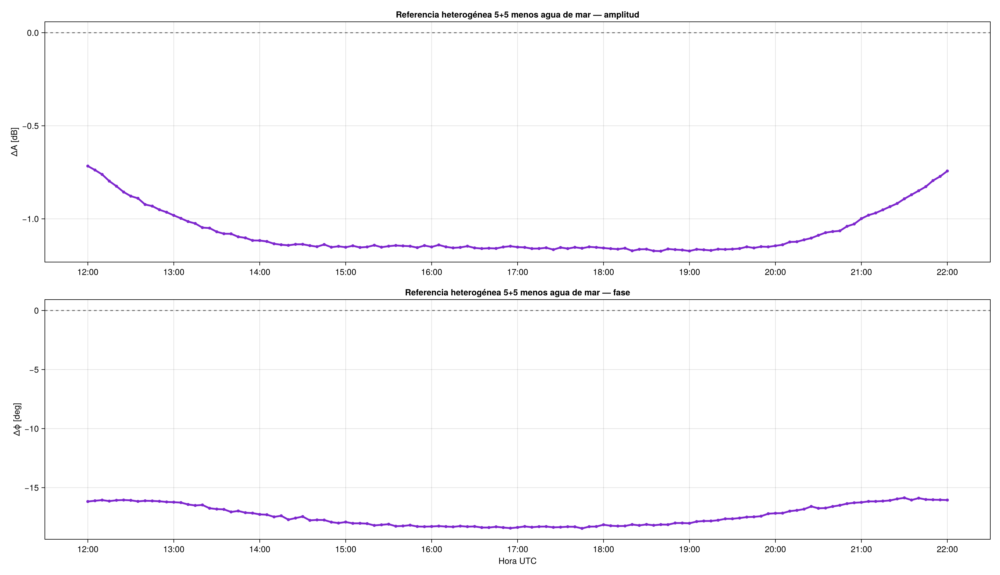

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/08_FIRI_reference_ocean5_goodsoil5_minus_seawater_12_22.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/08_FIRI_reference_ocean5_goodsoil5_minus_seawater_12_22.pdf")

In [20]:
################################################################################
# Diferencia entre referencias FIRI, 12:00–22:00 UTC:
# (5 mar + 5 buen suelo) - (solo agua de mar)
################################################################################

reference_indices_12_22 = findall(
    h -> 12.0 <= h <= 22.0,
    reference_hours,
)

isempty(reference_indices_12_22) && error(
    "Las referencias no contienen datos entre 12:00 y 22:00 UTC."
)

reference_hours_12_22 =
    reference_hours[reference_indices_12_22]

delta_reference_A_12_22 =
    reference_A[
        heterogeneous_reference_index,
        reference_indices_12_22,
    ] .-
    reference_A[
        ocean_reference_index,
        reference_indices_12_22,
    ]

delta_reference_phi_12_22 =
    reference_phi_deg[
        heterogeneous_reference_index,
        reference_indices_12_22,
    ] .-
    reference_phi_deg[
        ocean_reference_index,
        reference_indices_12_22,
    ]

xtick_hours_12_22 = collect(
    12.0:1.0:22.0
)

xtick_labels_12_22 = [
    @sprintf(
        "%02d:%02d",
        floor(Int, h),
        round(Int, 60 * (h % 1)),
    )
    for h in xtick_hours_12_22
]

fig_reference_difference_12_22 = CM.Figure(
    size = (1650, 950),
)

# ------------------------------------------------------------------------------
# Diferencia de amplitud
# ------------------------------------------------------------------------------

ax_delta_reference_A_12_22 = CM.Axis(
    fig_reference_difference_12_22[1, 1],
    title = "Referencia heterogénea 5+5 menos agua de mar — amplitud",
    ylabel = "ΔA [dB]",
    xticks = (
        xtick_hours_12_22,
        xtick_labels_12_22,
    ),
)

CM.hlines!(
    ax_delta_reference_A_12_22,
    [0.0];
    color = :gray40,
    linestyle = :dash,
    linewidth = 1.5,
)

CM.lines!(
    ax_delta_reference_A_12_22,
    reference_hours_12_22,
    delta_reference_A_12_22;
    color = :purple3,
    linewidth = 3.0,
)

CM.scatter!(
    ax_delta_reference_A_12_22,
    reference_hours_12_22,
    delta_reference_A_12_22;
    color = :purple3,
    markersize = 7,
)

# ------------------------------------------------------------------------------
# Diferencia de fase
# ------------------------------------------------------------------------------

ax_delta_reference_phi_12_22 = CM.Axis(
    fig_reference_difference_12_22[2, 1],
    title = "Referencia heterogénea 5+5 menos agua de mar — fase",
    xlabel = "Hora UTC",
    ylabel = "Δϕ [deg]",
    xticks = (
        xtick_hours_12_22,
        xtick_labels_12_22,
    ),
)

CM.hlines!(
    ax_delta_reference_phi_12_22,
    [0.0];
    color = :gray40,
    linestyle = :dash,
    linewidth = 1.5,
)

CM.lines!(
    ax_delta_reference_phi_12_22,
    reference_hours_12_22,
    delta_reference_phi_12_22;
    color = :purple3,
    linewidth = 3.0,
)

CM.scatter!(
    ax_delta_reference_phi_12_22,
    reference_hours_12_22,
    delta_reference_phi_12_22;
    color = :purple3,
    markersize = 7,
)

CM.linkxaxes!(
    ax_delta_reference_A_12_22,
    ax_delta_reference_phi_12_22,
)

CM.xlims!(
    ax_delta_reference_A_12_22,
    12,
    22,
)

# ------------------------------------------------------------------------------
# Guardado
# ------------------------------------------------------------------------------

reference_difference_12_22_png = joinpath(
    FIGURE_DIR,
    "08_FIRI_reference_ocean5_goodsoil5_minus_seawater_12_22.png",
)

reference_difference_12_22_pdf = joinpath(
    FIGURE_DIR,
    "08_FIRI_reference_ocean5_goodsoil5_minus_seawater_12_22.pdf",
)

CM.save(
    reference_difference_12_22_png,
    fig_reference_difference_12_22,
)

CM.save(
    reference_difference_12_22_pdf,
    fig_reference_difference_12_22,
)

display(
    fig_reference_difference_12_22,
)

(
    reference_difference_12_22_png,
    reference_difference_12_22_pdf,
)

Rango de referencias usado: 12.0–22.0 UTC
Rango de target Whittaker disponible en esta ventana: 16.0–22.0 UTC


┌ Warning: El target Whittaker no existe antes de 16.0 UTC dentro de la ventana 12:00–22:00. No se extrapolará.
└ @ Main In[22]:84


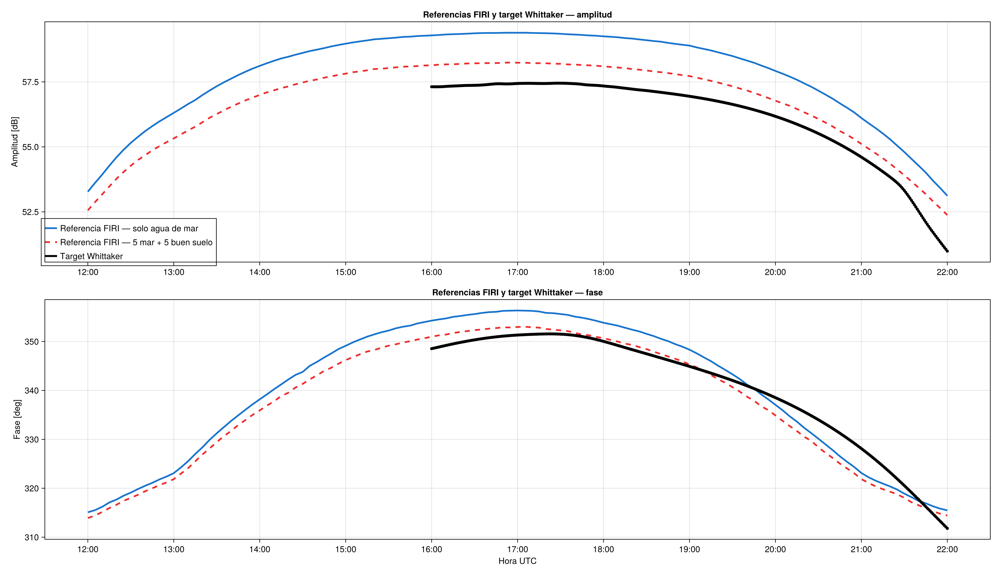

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_heterophaseplus15.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_heterophaseplus15.pdf")

In [22]:
################################################################################
# Series de referencia FIRI entre 12:00 y 22:00 UTC:
# solo agua de mar vs 5 mar + 5 buen suelo vs target Whittaker disponible
# con +15 deg aplicados únicamente a la fase de la referencia heterogénea
################################################################################

PHASE_SHIFT_HETEROGENEO_DEG = 15.0

# ------------------------------------------------------------------------------
# 1. Selección temporal 12:00–22:00 UTC
# ------------------------------------------------------------------------------

reference_indices_12_22 = findall(
    h -> 12.0 <= h <= 22.0,
    reference_hours,
)

isempty(reference_indices_12_22) && error(
    "Las referencias no contienen datos entre 12:00 y 22:00 UTC."
)

reference_hours_12_22 =
    reference_hours[reference_indices_12_22]

ocean_reference_A_12_22 =
    reference_A[
        ocean_reference_index,
        reference_indices_12_22,
    ]

heterogeneous_reference_A_12_22 =
    reference_A[
        heterogeneous_reference_index,
        reference_indices_12_22,
    ]

ocean_reference_phi_12_22 =
    reference_phi_deg[
        ocean_reference_index,
        reference_indices_12_22,
    ]

heterogeneous_reference_phi_12_22 =
    reference_phi_deg[
        heterogeneous_reference_index,
        reference_indices_12_22,
    ] .+ PHASE_SHIFT_HETEROGENEO_DEG

whittaker_indices_12_22 = findall(
    h -> 12.0 <= h <= 22.0,
    whittaker_hours,
)

isempty(whittaker_indices_12_22) && error(
    "El archivo Whittaker no contiene muestras dentro de 12:00–22:00 UTC."
)

whittaker_hours_12_22 =
    whittaker_hours[whittaker_indices_12_22]

whittaker_A_12_22 =
    whittaker_A[whittaker_indices_12_22]

whittaker_phi_12_22 =
    whittaker_phi[whittaker_indices_12_22]

println(
    "Rango de referencias usado: ",
    first(reference_hours_12_22),
    "–",
    last(reference_hours_12_22),
    " UTC",
)

println(
    "Rango de target Whittaker disponible en esta ventana: ",
    first(whittaker_hours_12_22),
    "–",
    last(whittaker_hours_12_22),
    " UTC",
)

if first(whittaker_hours_12_22) > 12.0
    @warn(
        "El target Whittaker no existe antes de $(first(whittaker_hours_12_22)) UTC " *
        "dentro de la ventana 12:00–22:00. No se extrapolará."
    )
end

# ------------------------------------------------------------------------------
# 2. Ejes temporales
# ------------------------------------------------------------------------------

xtick_hours_12_22 = collect(12.0:1.0:22.0)

xtick_labels_12_22 = [
    @sprintf(
        "%02d:%02d",
        floor(Int, h),
        round(Int, 60 * (h % 1)),
    )
    for h in xtick_hours_12_22
]

# ------------------------------------------------------------------------------
# 3. Figura
# ------------------------------------------------------------------------------

fig_reference_vs_target_12_22 = CM.Figure(
    size = (1650, 950),
)

# Amplitud
ax_reference_A_12_22 = CM.Axis(
    fig_reference_vs_target_12_22[1, 1],
    title = "Referencias FIRI y target Whittaker — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (
        xtick_hours_12_22,
        xtick_labels_12_22,
    ),
)

CM.lines!(
    ax_reference_A_12_22,
    reference_hours_12_22,
    ocean_reference_A_12_22;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.lines!(
    ax_reference_A_12_22,
    reference_hours_12_22,
    heterogeneous_reference_A_12_22;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "Referencia FIRI — 5 mar + 5 buen suelo",
)

CM.lines!(
    ax_reference_A_12_22,
    whittaker_hours_12_22,
    whittaker_A_12_22;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_reference_A_12_22,
    whittaker_hours_12_22,
    whittaker_A_12_22;
    color = :black,
    markersize = 7,
)

CM.axislegend(
    ax_reference_A_12_22;
    position = :lb,
    nbanks = 1,
)

# Fase
ax_reference_phi_12_22 = CM.Axis(
    fig_reference_vs_target_12_22[2, 1],
    title = "Referencias FIRI y target Whittaker — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (
        xtick_hours_12_22,
        xtick_labels_12_22,
    ),
)

CM.lines!(
    ax_reference_phi_12_22,
    reference_hours_12_22,
    ocean_reference_phi_12_22;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.lines!(
    ax_reference_phi_12_22,
    reference_hours_12_22,
    heterogeneous_reference_phi_12_22;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = @sprintf(
        "Referencia FIRI — 5 mar + 5 buen suelo (+%.0f deg)",
        PHASE_SHIFT_HETEROGENEO_DEG,
    ),
)

CM.lines!(
    ax_reference_phi_12_22,
    whittaker_hours_12_22,
    whittaker_phi_12_22;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_reference_phi_12_22,
    whittaker_hours_12_22,
    whittaker_phi_12_22;
    color = :black,
    markersize = 7,
)

CM.linkxaxes!(
    ax_reference_A_12_22,
    ax_reference_phi_12_22,
)

CM.xlims!(
    ax_reference_A_12_22,
    12,
    22,
)

# ------------------------------------------------------------------------------
# 4. Guardado
# ------------------------------------------------------------------------------

reference_vs_target_12_22_png = joinpath(
    FIGURE_DIR,
    "07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_heterophaseplus15.png",
)

reference_vs_target_12_22_pdf = joinpath(
    FIGURE_DIR,
    "07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_heterophaseplus15.pdf",
)

CM.save(
    reference_vs_target_12_22_png,
    fig_reference_vs_target_12_22,
)

CM.save(
    reference_vs_target_12_22_pdf,
    fig_reference_vs_target_12_22,
)

display(
    fig_reference_vs_target_12_22,
)

(
    reference_vs_target_12_22_png,
    reference_vs_target_12_22_pdf,
)

Rango de referencias usado: 12.0–22.0 UTC
Rango de target Whittaker disponible: 16.0–22.0 UTC
Corrección aplicada únicamente a la referencia heterogénea:
  amplitud = -1.0 dB
  fase     = +15.0 deg


┌ Warning: El target Whittaker no existe antes de 16.0 UTC dentro de la ventana 12:00–22:00. No se extrapolará.
└ @ Main In[25]:108


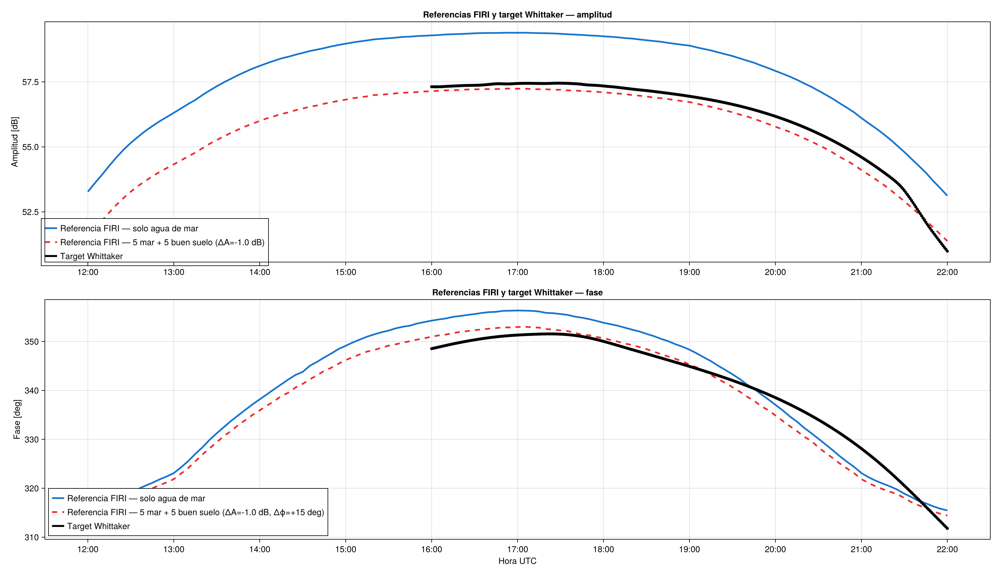

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_ampplus1_phaseplus15.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_ampplus1_phaseplus15.pdf")

In [25]:
################################################################################
# Series de referencia FIRI entre 12:00 y 22:00 UTC:
# solo agua de mar vs 5 mar + 5 buen suelo vs target Whittaker disponible
#
# Factores aditivos aplicados únicamente a la referencia heterogénea:
#   amplitud: +1.0 dB
#   fase:     +15 deg
################################################################################

AMPLITUDE_SHIFT_HETEROGENEO_DB = -1.0
PHASE_SHIFT_HETEROGENEO_DEG = 15.0

# ------------------------------------------------------------------------------
# 1. Selección temporal 12:00–22:00 UTC
# ------------------------------------------------------------------------------

reference_indices_12_22 = findall(
    h -> 12.0 <= h <= 22.0,
    reference_hours,
)

isempty(reference_indices_12_22) && error(
    "Las referencias no contienen datos entre 12:00 y 22:00 UTC."
)

reference_hours_12_22 =
    reference_hours[reference_indices_12_22]

# Referencia homogénea de agua de mar sin modificaciones.
ocean_reference_A_12_22 =
    reference_A[
        ocean_reference_index,
        reference_indices_12_22,
    ]

ocean_reference_phi_12_22 =
    reference_phi_deg[
        ocean_reference_index,
        reference_indices_12_22,
    ]

# Referencia heterogénea con los factores aditivos solicitados.
heterogeneous_reference_A_12_22 =
    reference_A[
        heterogeneous_reference_index,
        reference_indices_12_22,
    ] .+ AMPLITUDE_SHIFT_HETEROGENEO_DB

heterogeneous_reference_phi_12_22 =
    reference_phi_deg[
        heterogeneous_reference_index,
        reference_indices_12_22,
    ] .+ PHASE_SHIFT_HETEROGENEO_DEG

# ------------------------------------------------------------------------------
# 2. Target Whittaker disponible dentro de la ventana
# ------------------------------------------------------------------------------

whittaker_indices_12_22 = findall(
    h -> 12.0 <= h <= 22.0,
    whittaker_hours,
)

isempty(whittaker_indices_12_22) && error(
    "El archivo Whittaker no contiene muestras dentro de 12:00–22:00 UTC."
)

whittaker_hours_12_22 =
    whittaker_hours[whittaker_indices_12_22]

whittaker_A_12_22 =
    whittaker_A[whittaker_indices_12_22]

whittaker_phi_12_22 =
    whittaker_phi[whittaker_indices_12_22]

println(
    "Rango de referencias usado: ",
    first(reference_hours_12_22),
    "–",
    last(reference_hours_12_22),
    " UTC",
)

println(
    "Rango de target Whittaker disponible: ",
    first(whittaker_hours_12_22),
    "–",
    last(whittaker_hours_12_22),
    " UTC",
)

println(
    "Corrección aplicada únicamente a la referencia heterogénea:",
)

@printf(
    "  amplitud = %+.1f dB\n",
    AMPLITUDE_SHIFT_HETEROGENEO_DB,
)

@printf(
    "  fase     = %+.1f deg\n",
    PHASE_SHIFT_HETEROGENEO_DEG,
)

if first(whittaker_hours_12_22) > 12.0
    @warn(
        "El target Whittaker no existe antes de " *
        "$(first(whittaker_hours_12_22)) UTC dentro de la ventana " *
        "12:00–22:00. No se extrapolará."
    )
end

# ------------------------------------------------------------------------------
# 3. Ejes temporales
# ------------------------------------------------------------------------------

xtick_hours_12_22 = collect(12.0:1.0:22.0)

xtick_labels_12_22 = [
    @sprintf(
        "%02d:%02d",
        floor(Int, h),
        round(Int, 60 * (h % 1)),
    )
    for h in xtick_hours_12_22
]

# ------------------------------------------------------------------------------
# 4. Figura
# ------------------------------------------------------------------------------

fig_reference_vs_target_12_22 = CM.Figure(
    size = (1650, 950),
)

# ------------------------------------------------------------------------------
# Amplitud
# ------------------------------------------------------------------------------

ax_reference_A_12_22 = CM.Axis(
    fig_reference_vs_target_12_22[1, 1],
    title = "Referencias FIRI y target Whittaker — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (
        xtick_hours_12_22,
        xtick_labels_12_22,
    ),
)

CM.lines!(
    ax_reference_A_12_22,
    reference_hours_12_22,
    ocean_reference_A_12_22;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.lines!(
    ax_reference_A_12_22,
    reference_hours_12_22,
    heterogeneous_reference_A_12_22;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = @sprintf(
        "Referencia FIRI — 5 mar + 5 buen suelo (ΔA=%+.1f dB)",
        AMPLITUDE_SHIFT_HETEROGENEO_DB,
    ),
)

CM.lines!(
    ax_reference_A_12_22,
    whittaker_hours_12_22,
    whittaker_A_12_22;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_reference_A_12_22,
    whittaker_hours_12_22,
    whittaker_A_12_22;
    color = :black,
    markersize = 7,
)

CM.axislegend(
    ax_reference_A_12_22;
    position = :lb,
    nbanks = 1,
)

# ------------------------------------------------------------------------------
# Fase
# ------------------------------------------------------------------------------

ax_reference_phi_12_22 = CM.Axis(
    fig_reference_vs_target_12_22[2, 1],
    title = "Referencias FIRI y target Whittaker — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (
        xtick_hours_12_22,
        xtick_labels_12_22,
    ),
)

CM.lines!(
    ax_reference_phi_12_22,
    reference_hours_12_22,
    ocean_reference_phi_12_22;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.lines!(
    ax_reference_phi_12_22,
    reference_hours_12_22,
    heterogeneous_reference_phi_12_22;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = @sprintf(
        "Referencia FIRI — 5 mar + 5 buen suelo (ΔA=%+.1f dB, Δϕ=%+.0f deg)",
        AMPLITUDE_SHIFT_HETEROGENEO_DB,
        PHASE_SHIFT_HETEROGENEO_DEG,
    ),
)

CM.lines!(
    ax_reference_phi_12_22,
    whittaker_hours_12_22,
    whittaker_phi_12_22;
    color = :black,
    linewidth = 3.2,
    label = "Target Whittaker",
)

CM.scatter!(
    ax_reference_phi_12_22,
    whittaker_hours_12_22,
    whittaker_phi_12_22;
    color = :black,
    markersize = 7,
)

# Leyenda añadida explícitamente al subgráfico inferior.
CM.axislegend(
    ax_reference_phi_12_22;
    position = :lb,
    nbanks = 1,
)

# ------------------------------------------------------------------------------
# 5. Formato común
# ------------------------------------------------------------------------------

CM.linkxaxes!(
    ax_reference_A_12_22,
    ax_reference_phi_12_22,
)

CM.xlims!(
    ax_reference_A_12_22,
    12,
    22,
)

# ------------------------------------------------------------------------------
# 6. Guardado
# ------------------------------------------------------------------------------

reference_vs_target_12_22_png = joinpath(
    FIGURE_DIR,
    "07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_ampplus1_phaseplus15.png",
)

reference_vs_target_12_22_pdf = joinpath(
    FIGURE_DIR,
    "07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_ampplus1_phaseplus15.pdf",
)

CM.save(
    reference_vs_target_12_22_png,
    fig_reference_vs_target_12_22,
)

CM.save(
    reference_vs_target_12_22_pdf,
    fig_reference_vs_target_12_22,
)

display(
    fig_reference_vs_target_12_22,
)

(
    reference_vs_target_12_22_png,
    reference_vs_target_12_22_pdf,
)

Rango de referencias usado: 12.0–22.0 UTC
Rango de target Whittaker disponible: 16.0–22.0 UTC
Corrección aplicada únicamente al target Whittaker:
  amplitud = +1.0 dB
  fase     = -15.0 deg


┌ Warning: El target Whittaker no existe antes de 16.0 UTC dentro de la ventana 12:00–22:00. No se extrapolará.
└ @ Main In[26]:110


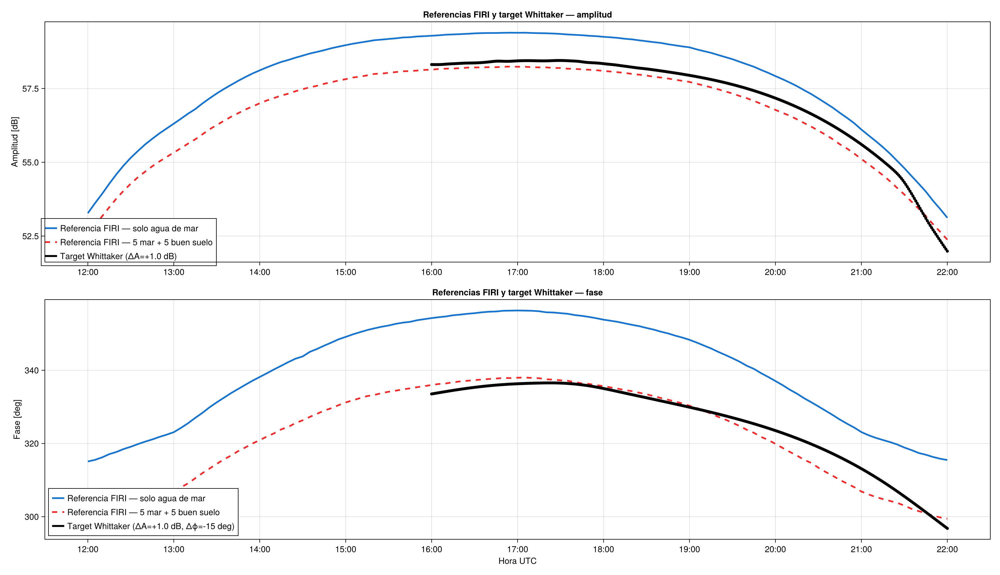

("/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_targetshifted.png", "/home/jp/basefolder_JP/comparison_whittaker_BBO1_seawater_vs_ocean5_goodsoil5/07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_targetshifted.pdf")

In [26]:
################################################################################
# Series de referencia FIRI entre 12:00 y 22:00 UTC:
# solo agua de mar vs 5 mar + 5 buen suelo vs target Whittaker disponible
#
# Sin correcciones sobre las referencias FIRI.
# Correcciones aplicadas únicamente al target Whittaker:
#   amplitud: +1.0 dB
#   fase:     -15 deg
################################################################################

TARGET_AMPLITUDE_SHIFT_DB = 1.0
TARGET_PHASE_SHIFT_DEG = -15.0

# ------------------------------------------------------------------------------
# 1. Selección temporal 12:00–22:00 UTC
# ------------------------------------------------------------------------------

reference_indices_12_22 = findall(
    h -> 12.0 <= h <= 22.0,
    reference_hours,
)

isempty(reference_indices_12_22) && error(
    "Las referencias no contienen datos entre 12:00 y 22:00 UTC."
)

reference_hours_12_22 =
    reference_hours[reference_indices_12_22]

# Referencias FIRI sin modificaciones.
ocean_reference_A_12_22 =
    reference_A[
        ocean_reference_index,
        reference_indices_12_22,
    ]

ocean_reference_phi_12_22 =
    reference_phi_deg[
        ocean_reference_index,
        reference_indices_12_22,
    ]

heterogeneous_reference_A_12_22 =
    reference_A[
        heterogeneous_reference_index,
        reference_indices_12_22,
    ]

heterogeneous_reference_phi_12_22 =
    reference_phi_deg[
        heterogeneous_reference_index,
        reference_indices_12_22,
    ]

# ------------------------------------------------------------------------------
# 2. Target Whittaker disponible dentro de la ventana, con shifts solicitados
# ------------------------------------------------------------------------------

whittaker_indices_12_22 = findall(
    h -> 12.0 <= h <= 22.0,
    whittaker_hours,
)

isempty(whittaker_indices_12_22) && error(
    "El archivo Whittaker no contiene muestras dentro de 12:00–22:00 UTC."
)

whittaker_hours_12_22 =
    whittaker_hours[whittaker_indices_12_22]

whittaker_A_12_22 =
    whittaker_A[whittaker_indices_12_22] .+
    TARGET_AMPLITUDE_SHIFT_DB

whittaker_phi_12_22 =
    whittaker_phi[whittaker_indices_12_22] .+
    TARGET_PHASE_SHIFT_DEG

println(
    "Rango de referencias usado: ",
    first(reference_hours_12_22),
    "–",
    last(reference_hours_12_22),
    " UTC",
)

println(
    "Rango de target Whittaker disponible: ",
    first(whittaker_hours_12_22),
    "–",
    last(whittaker_hours_12_22),
    " UTC",
)

println(
    "Corrección aplicada únicamente al target Whittaker:",
)

@printf(
    "  amplitud = %+.1f dB\n",
    TARGET_AMPLITUDE_SHIFT_DB,
)

@printf(
    "  fase     = %+.1f deg\n",
    TARGET_PHASE_SHIFT_DEG,
)

if first(whittaker_hours_12_22) > 12.0
    @warn(
        "El target Whittaker no existe antes de $(first(whittaker_hours_12_22)) UTC " *
        "dentro de la ventana 12:00–22:00. No se extrapolará."
    )
end

# ------------------------------------------------------------------------------
# 3. Ejes temporales
# ------------------------------------------------------------------------------

xtick_hours_12_22 = collect(12.0:1.0:22.0)

xtick_labels_12_22 = [
    @sprintf(
        "%02d:%02d",
        floor(Int, h),
        round(Int, 60 * (h % 1)),
    )
    for h in xtick_hours_12_22
]

# ------------------------------------------------------------------------------
# 4. Figura
# ------------------------------------------------------------------------------

fig_reference_vs_target_12_22 = CM.Figure(
    size = (1650, 950),
)

# ------------------------------------------------------------------------------
# Amplitud
# ------------------------------------------------------------------------------

ax_reference_A_12_22 = CM.Axis(
    fig_reference_vs_target_12_22[1, 1],
    title = "Referencias FIRI y target Whittaker — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = (
        xtick_hours_12_22,
        xtick_labels_12_22,
    ),
)

CM.lines!(
    ax_reference_A_12_22,
    reference_hours_12_22,
    ocean_reference_A_12_22;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.lines!(
    ax_reference_A_12_22,
    reference_hours_12_22,
    heterogeneous_reference_A_12_22;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "Referencia FIRI — 5 mar + 5 buen suelo",
)

CM.lines!(
    ax_reference_A_12_22,
    whittaker_hours_12_22,
    whittaker_A_12_22;
    color = :black,
    linewidth = 3.2,
    label = @sprintf(
        "Target Whittaker (ΔA=%+.1f dB)",
        TARGET_AMPLITUDE_SHIFT_DB,
    ),
)

CM.scatter!(
    ax_reference_A_12_22,
    whittaker_hours_12_22,
    whittaker_A_12_22;
    color = :black,
    markersize = 7,
)

CM.axislegend(
    ax_reference_A_12_22;
    position = :lb,
    nbanks = 1,
)

# ------------------------------------------------------------------------------
# Fase
# ------------------------------------------------------------------------------

ax_reference_phi_12_22 = CM.Axis(
    fig_reference_vs_target_12_22[2, 1],
    title = "Referencias FIRI y target Whittaker — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = (
        xtick_hours_12_22,
        xtick_labels_12_22,
    ),
)

CM.lines!(
    ax_reference_phi_12_22,
    reference_hours_12_22,
    ocean_reference_phi_12_22;
    color = :dodgerblue3,
    linewidth = 2.8,
    label = "Referencia FIRI — solo agua de mar",
)

CM.lines!(
    ax_reference_phi_12_22,
    reference_hours_12_22,
    heterogeneous_reference_phi_12_22;
    color = :firebrick2,
    linewidth = 2.8,
    linestyle = :dash,
    label = "Referencia FIRI — 5 mar + 5 buen suelo",
)

CM.lines!(
    ax_reference_phi_12_22,
    whittaker_hours_12_22,
    whittaker_phi_12_22;
    color = :black,
    linewidth = 3.2,
    label = @sprintf(
        "Target Whittaker (ΔA=%+.1f dB, Δϕ=%+.0f deg)",
        TARGET_AMPLITUDE_SHIFT_DB,
        TARGET_PHASE_SHIFT_DEG,
    ),
)

CM.scatter!(
    ax_reference_phi_12_22,
    whittaker_hours_12_22,
    whittaker_phi_12_22;
    color = :black,
    markersize = 7,
)

CM.axislegend(
    ax_reference_phi_12_22;
    position = :lb,
    nbanks = 1,
)

# ------------------------------------------------------------------------------
# 5. Formato común
# ------------------------------------------------------------------------------

CM.linkxaxes!(
    ax_reference_A_12_22,
    ax_reference_phi_12_22,
)

CM.xlims!(
    ax_reference_A_12_22,
    12,
    22,
)

# ------------------------------------------------------------------------------
# 6. Guardado
# ------------------------------------------------------------------------------

reference_vs_target_12_22_png = joinpath(
    FIGURE_DIR,
    "07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_targetshifted.png",
)

reference_vs_target_12_22_pdf = joinpath(
    FIGURE_DIR,
    "07_FIRI_reference_seawater_vs_ocean5_goodsoil5_vs_Whittaker_12_22_targetshifted.pdf",
)

CM.save(
    reference_vs_target_12_22_png,
    fig_reference_vs_target_12_22,
)

CM.save(
    reference_vs_target_12_22_pdf,
    fig_reference_vs_target_12_22,
)

display(
    fig_reference_vs_target_12_22,
)

(
    reference_vs_target_12_22_png,
    reference_vs_target_12_22_pdf,
)